In [1]:
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import numpy as np

import skimage
from skimage import exposure
from skimage import io, color
from skimage import filters

In [2]:
%matplotlib inline
pylab.rcParams['figure.figsize'] = (20.0, 7.0)

# общие функции

In [3]:
import warnings

#переводит массив изображения из диапазона 0-255 в диапозон 0.0-1.0
def img_as_float(img):
    warnings.filterwarnings("ignore")
    result = skimage.img_as_float(img)
    warnings.filterwarnings("default")    
    return result

#переводит массив изображения из диапазона 0.0-1.0 в диапозон 0-255
def img_as_ubyte(img):
    warnings.filterwarnings("ignore")
    result = skimage.img_as_ubyte(img)
    warnings.filterwarnings("default")
    return result

#возвращает карту разностей изображений
def difference_map(img1,img2):
    result = np.abs(img1.astype(np.int) - img2.astype(np.int)).astype(np.uint8)
    result = img_as_ubyte(color.rgb2gray(result))
    return result

def load_image(name):
    try:
        img = Image.open(name)
        rgb = np.array(img.convert('RGB')) #загружаем изображение как RGB 
        gray = np.array(img.convert('L')) #загружаем изображение как Grayscale 
        print ('Image matrix size: ', rgb.shape) 
    except: 
        print("\nОшибка при открытии файла. Проверте имя или наличие файла в каталоге с проектом [EXIT]\n")
    return rgb,gray

# 2.1

# Попробуем линейное растяжение яркости

Image matrix size:  (683, 1024, 3)
максимум изображения:  208
минимум изображения:  114


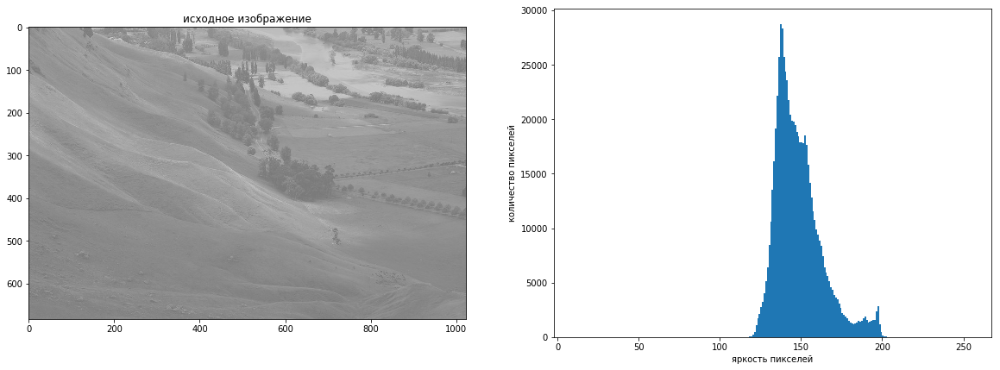

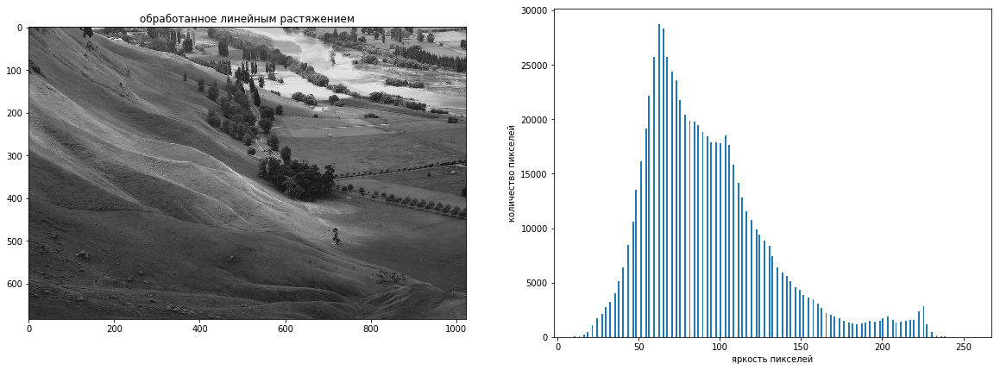

In [4]:
ImageRGBArr,ImageGrayArr = load_image("for_histogram_equalization_1.jpg")

#возвращает гистограмму в виде одномерных массивов x,y
#img - массив RGB
def histogram_from_rgb(img):
    #цветовой режим Grayscale содержит только информацию о яркости изображения.
    #следовательно для построении гистограммы предварительно нужно перевести изображение RGB в режим Grayscale
    #создаем массив в соответствующих номеру ячейках которого хранится колличество пикселей значением равных номеру ячейки
    #создаем одномерный массив от 0 до 255. он нужен для построения на гистограмме оси x
    x = np.array(range(256))
    t = img_as_ubyte(color.rgb2gray(img))
    #подсчитываем сколько в массиве повторений каждого числа 
    y = np.bincount(t.ravel(),minlength=256)
    return x,y

# Гистограмма – это график распределения яркостей на изображении. На горизонтальной оси - шкала яркостей
# тонов от белого до черного, на вертикальной оси - число пикселей заданной яркости
#выводим изображение а рядом гистограмму
def display_image_and_histogram(img, title):
    x,y = histogram_from_rgb(img)
    plt.subplot(121)
    plt.imshow(img), plt.title(title)
    ax = plt.subplot(122)
    ax.hist(x, bins=np.arange(10, 256), weights=y)
    ax.set_xlabel('яркость пикселей')
    ax.set_ylabel('количество пикселей')
    plt.show()



img_max = np.max(ImageRGBArr) 
img_min = np.min(ImageRGBArr)
print ('максимум изображения: ',img_max)
print ('минимум изображения: ',img_min)
img_rescale = exposure.rescale_intensity(ImageRGBArr, in_range = (img_min,img_max))

display_image_and_histogram(ImageRGBArr, 'исходное изображение')
display_image_and_histogram(img_rescale, 'обработанное линейным растяжением')

# Но линейное растяжение работает не всегда!

Image matrix size:  (528, 800, 3)
максимум для линейного растяжения:  255
минимум для линейного растяжения:  0


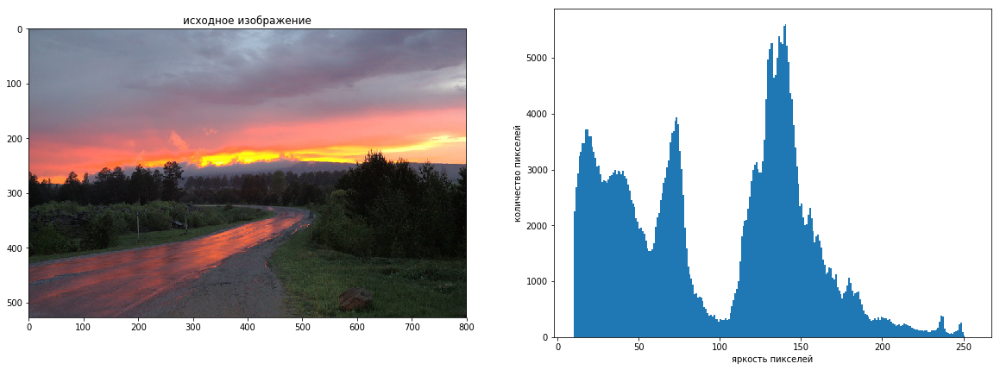

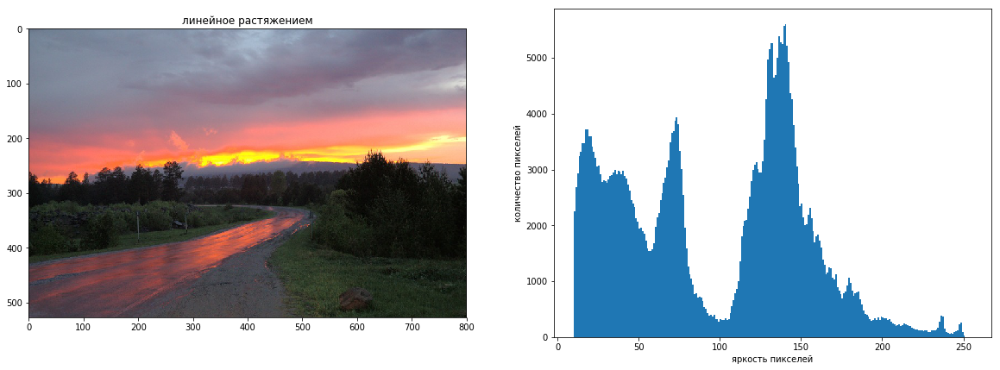

In [5]:
ImageRGBArr,ImageGrayArr = load_image("for_histogram_equalization_2.jpg")

img_max = np.max(ImageRGBArr) 
img_min = np.min(ImageRGBArr)
print ('максимум для линейного растяжения: ',img_max)
print ('минимум для линейного растяжения: ',img_min)
img_rescale = exposure.rescale_intensity(ImageRGBArr, in_range = (img_min,img_max))

display_image_and_histogram(ImageRGBArr, 'исходное изображение')
display_image_and_histogram(img_rescale, 'линейное растяжением')

# Робастное линейное растяжение яркости

максимум для линейного растяжения:  175
минимум для линейного растяжения:  17


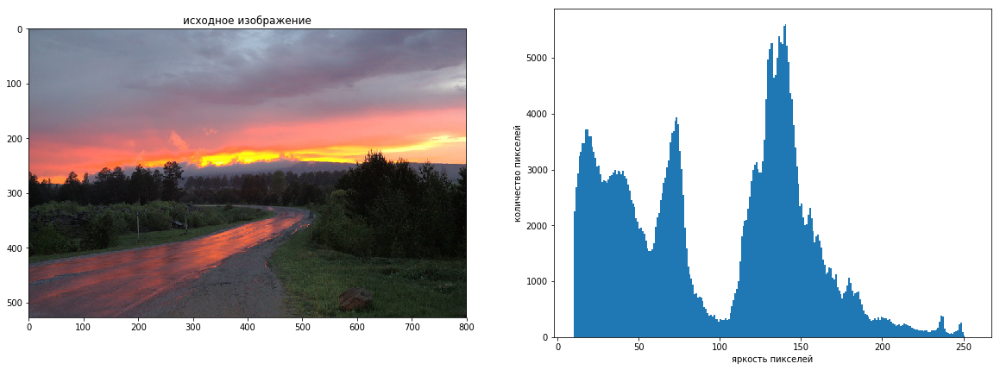

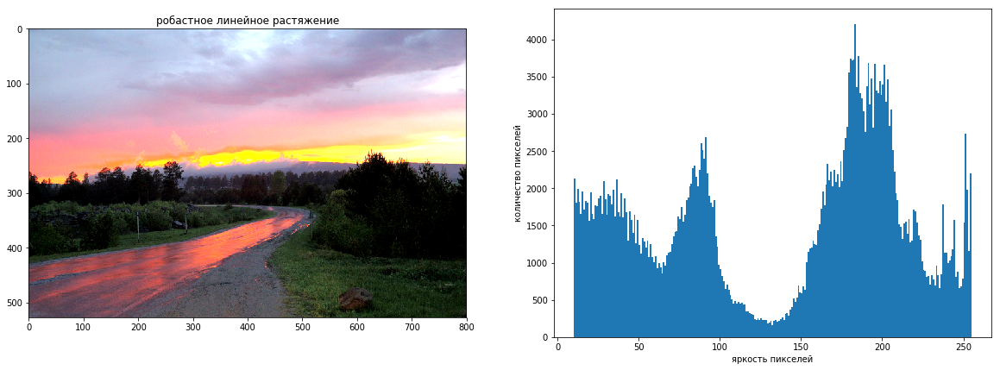

In [6]:
# возьмем порог 8%
# Процентиль – это процент пикселей из массива, значением столько же или меньше чем конкретный пиксель.
# если мы возьмем порог 10% то функция percentile вернет пиксель из массива значенИе которого будет выше 10%
# от количества всех пикселей. к примеру, если у нас есть массив от 1 до 100 то np.percentile(array,10) вернет
# значение 10, что будет означать, что 10% значений массива меньше или равны 10. 
img_min, img_max = np.percentile(ImageRGBArr, (0 + 8, 100 - 8)).astype(np.uint8)
# img_min - 8% пикселей в массиве меньше или равны pimg_min8 
# img_max - 8% пикселей в массиве больше или равны img_max

print ('максимум для линейного растяжения: ',img_max)
print ('минимум для линейного растяжения: ',img_min)
img_rescale = exposure.rescale_intensity(ImageRGBArr, in_range = (img_min,img_max))

display_image_and_histogram(ImageRGBArr, 'исходное изображение')
display_image_and_histogram(img_rescale, 'робастное линейное растяжение')

# 2.2

Image matrix size:  (805, 1000, 3)


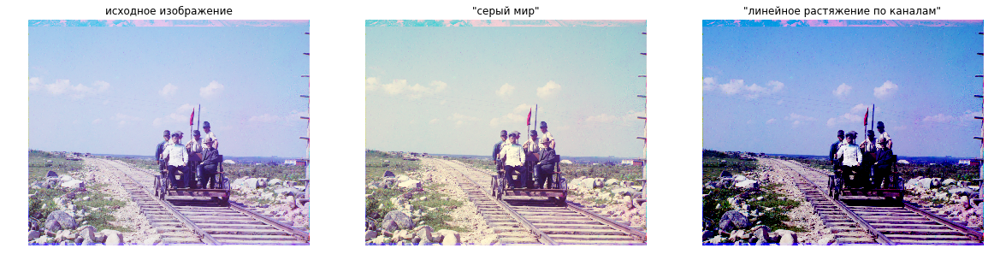

In [7]:
#для лучшего восприятия результатов операциы применим другое исходное изображение
ImageRGBArr,ImageGrayArr = load_image("for_gray_world.png")

# применим операцию «линейное растяжение по каналам». 
rescale_arr = np.array(ImageRGBArr)
#мы применяем отдельно линейное растяжение для каждого канала. это приведет к изменению цветов, в отличии от
#"линейное растяжение яркости" где изменения цветов не значительное, меняются только яркости 
for chann in range(3):
    rescale_arr[:, :, chann] = exposure.rescale_intensity(ImageRGBArr[:, :, chann], in_range = (120,250))


# Алгоритм модели "серый мир"
# 1. Сконвертируем изображение в вещественные числа.
# 2. Рассчитываем коэффициенты для каждого канала.
# 3. Делим каналы изображения на коэффициенты.
# 4. Обрезаем значения пикселей, чтобы они не выходили из допустимого диапазона [0; 255].
def grey_world(rgb): 
    #конвентируем тип данных во float
    rgb_f = rgb.astype(np.float32)
    #подсчитаем среднии коэффициенты для каждого канала
    avg_r = np.average(rgb_f[:, :, 0])
    avg_g = np.average(rgb_f[:, :, 1])
    avg_b = np.average(rgb_f[:, :, 2])
    x = (avg_r + avg_g + avg_b)/3 #среднее для всех каналов
    avg = np.array([avg_r,avg_g,avg_b])/x #среднее каждого канала делиться на среднее всех каналов
    #делим все каналы на коэффициенты
    for chann in range(3):
        if avg[chann]!=0: rgb_f[:, :, chann] = np.round(rgb_f[:, :, chann]/avg[chann])
        else: rgb_f[:, :, chann] = 0
    #обрезаем значения пикселей, чтобы они не выходили из допустимого диапазона [0; 255]
    rgb_f = np.clip(rgb_f,0,255)
    out = np.array(rgb_f.astype(np.uint8))  #переводим в uint8
    return out      

grey_world_arr = grey_world(ImageRGBArr)
plt.subplot(131) 
plt.imshow(ImageRGBArr), plt.title('исходное изображение'),plt.axis('off')
plt.subplot(132) 
plt.imshow(grey_world_arr), plt.title('"серый мир"'),plt.axis('off')
plt.subplot(133) 
plt.imshow(rescale_arr), plt.title('"линейное растяжение по каналам"'),plt.axis('off')
plt.show()


# 2.3

Image matrix size:  (372, 499, 3)


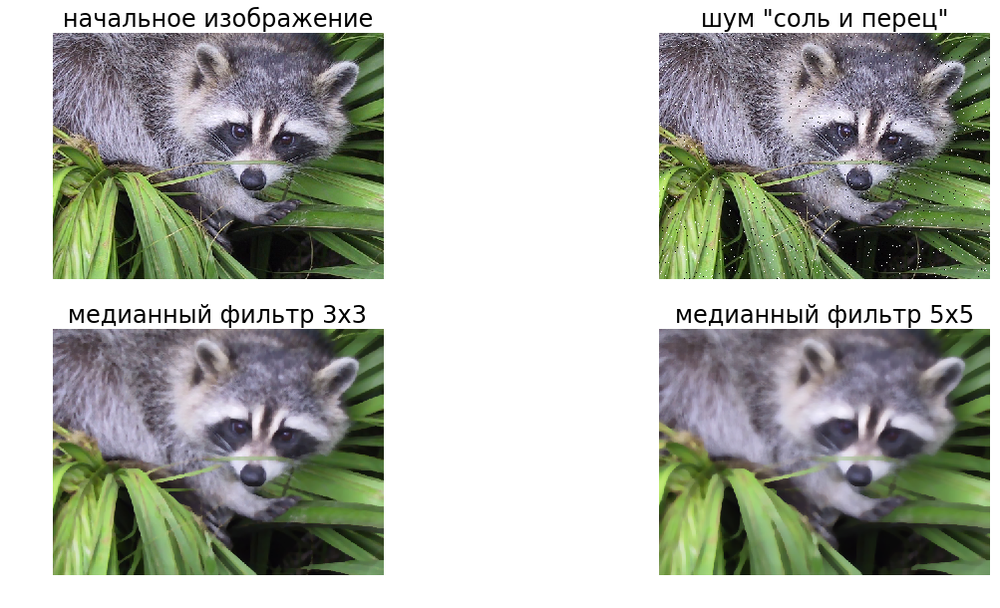

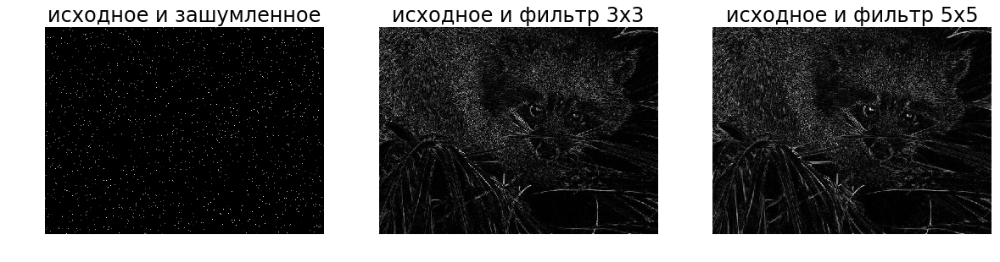

In [14]:
from skimage.morphology import disk
ImageRGBArr,ImageGrayArr = load_image("for_filter.png")
#функция добавления шума "соль и перец"
def salt_and_pepper(img, pad = 100):
    #создаем массив случайных целых чисел от 0 до pad размером исходного изображения
    noise = np.random.randint(pad, size = (img.shape[0], img.shape[1], 1))
    #в исходном изображении, меняем пиксели согласно минимальному и максимальному значению в массиве шума.
    #там где в массиве шума у нас 0 меняем в массиве изображения на 255, и где pad-1 меняем в изображении на 0
    img = np.where(noise == 0, 255, img)
    img = np.where(noise == pad-1, 0, img)
    return img

#зашумляем исходное изображение
SaltAndPepperArr = salt_and_pepper(ImageRGBArr, pad = 101)
#Median filter – резких границ не портит, убирает мелкие детали. изображение выглядит менее естественно
Median3x3Arr = np.zeros_like(ImageRGBArr)
Median5x5Arr = np.zeros_like(ImageRGBArr)
for chann in range(3):
    Median3x3Arr[:,:,chann] = filters.median(SaltAndPepperArr[:,:,chann], disk(3))
    Median5x5Arr[:,:,chann] = filters.median(SaltAndPepperArr[:,:,chann], disk(5))  
    
plt.figure(figsize=(20, 10))
plt.subplot(221), plt.title('начальное изображение'), plt.axis('off')
plt.imshow(ImageRGBArr)
plt.subplot(222), plt.title('шум "соль и перец"'), plt.axis('off')
plt.imshow(SaltAndPepperArr)
plt.subplot(223), plt.title('медианный фильтр 3х3'), plt.axis('off')
plt.imshow(Median3x3Arr)
plt.subplot(224), plt.title('медианный фильтр 5х5'), plt.axis('off')
plt.imshow(Median5x5Arr)
plt.show()

#карта разности между исходным изображением и зашумленным
MapScrNoiseArr = difference_map(ImageRGBArr, SaltAndPepperArr)
#карта разности между исходным изображением и скоректированным
MapScrFilter3x3Arr = difference_map(ImageRGBArr, Median3x3Arr) 
MapScrFilter5x5Arr = difference_map(ImageRGBArr, Median5x5Arr)


plt.subplot(131), plt.title('исходное и зашумленное'), plt.axis('off')
plt.imshow(color.rgb2gray(MapScrNoiseArr), cmap='gray')
plt.subplot(132), plt.title('исходное и фильтр 3х3'), plt.axis('off')
plt.imshow(color.rgb2gray(MapScrFilter3x3Arr), cmap='gray')
plt.subplot(133), plt.title('исходное и фильтр 5х5'), plt.axis('off') 
plt.imshow(color.rgb2gray(MapScrFilter5x5Arr), cmap='gray')
plt.show()

# 4.0

# Функции свертки

In [9]:
#Эта функция принимает изображение и ядро и возвращает их свертку
    # Args:image: массив numpy, kernel: массив numpy, mode = replicate (добавленные строки и столбцы 
    # заполняются крайними значениями массива) иначе нулями
    # Returns: массив numpy
#Результат свертки изображения рассчитывается следующим образом:    
#1. Переворачиваем ядро как по горизонтали, так и по вертикали.    
#2. Помещаем первый элемент ядра на каждый пиксель изображения (элемент матрицы изображения).    
#3. Умножаем каждый элемент ядра на соответствующий элемент матрицы изображения (тот, который перекрывается с ним). Суммируем,
#   результаты, делим на коэффициент нормирования, и помещаем значение в том же положении в выходной матрице, что и центр ядра в матрице изображений.
#4. Для пикселей на границе матрицы изображения некоторые элементы ядра будут выходить за края матрицы изображения, 
#   следовательно, не имеют соответствующего элемента из матрицы изображения. 
#   Мы дополним матрицу изображения нулевыми элементами или крайними пиксилями
def convolve_2d(image, kernel, mode = 'replicate'):
    kernel = np.flipud(np.fliplr(kernel))    # переворачиваем массив ядра в направлении верх-низ, потом лево-право
    result = np.zeros_like(image).astype(np.int) # создаем массив для результата свертки
    #добавим нулевые строки и столбцы к входному изображжению
    image_padded = np.zeros((image.shape[0] + 2, image.shape[1] + 2))
    image_padded[1:-1, 1:-1] = image
    #заполняем дополнение крайними пикселями изображения
    if mode == 'replicate':
        image_padded[:,0] = np.copy(image_padded[:,1]) 
        image_padded[:,-1] = np.copy(image_padded[:,-2]) 
        image_padded[0,:] = np.copy(image_padded[1,:]) 
        image_padded[-1,:] = np.copy(image_padded[-2,:])         
       
    for x in range(image.shape[1]):     #Переберем все пиксели изображения
        for y in range(image.shape[0]):
            # перемножаем соответствующие элементы ядра изображения, суммируем и делим на коэффициент нормирования
            result[y,x]=round((kernel*image_padded[y:y+3,x:x+3]).sum())

                    
    result = np.clip(result, 0, 255) #обрезаем значения выходящие из диапозона 0-255                         
    return result.astype(np.uint8)

def convolve(image, kernel, *mode):
    result = np.zeros_like(image)
    for chann in range(3):
        result[:,:,chann] = convolve_2d(image[:,:,chann], kernel, *mode)
    return result

# Ядра фильтров

In [10]:
# Ядра
KernelsList = {
                'усреднение':     1/9*np.array( [[ 1 , 1 , 1 ], [ 1 , 1 , 1 ], [ 1 , 1 , 1 ]] ),
                'сдвиг на 1':         np.array( [[ 0 , 1 , 0 ], [ 0 , 0 , 0 ], [ 0 , 0 , 0 ]] ),
                'гауссов':       1/16*np.array( [[ 1 , 2 , 1 ], [ 2 , 4 , 2 ], [ 1 , 2 , 1 ]] ),
                'повышение резкости': 1/10*np.array( [[ -1 , -2 , -1 ], [ -2 , 22 , -2 ], [ -1 , -2 , -1 ]] ),
              }

# Применяем фильтры

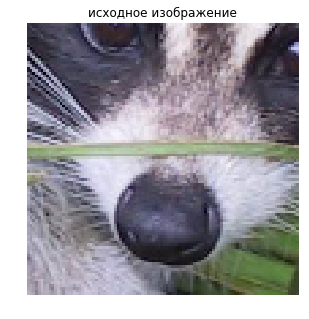

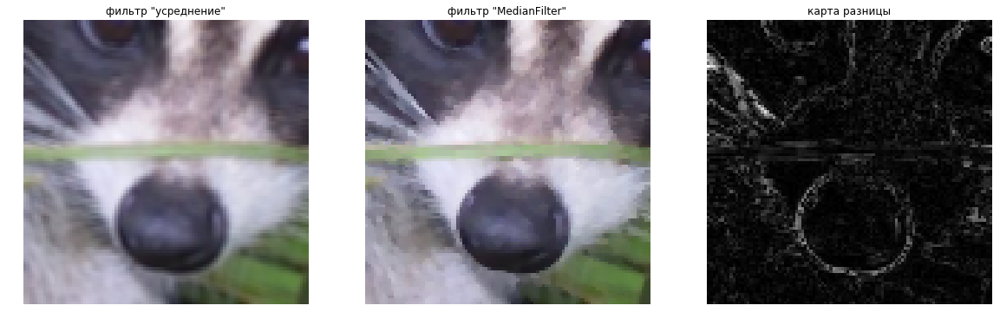

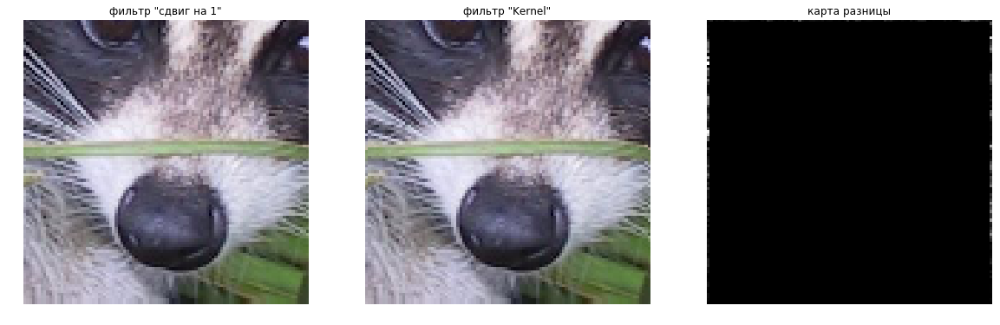

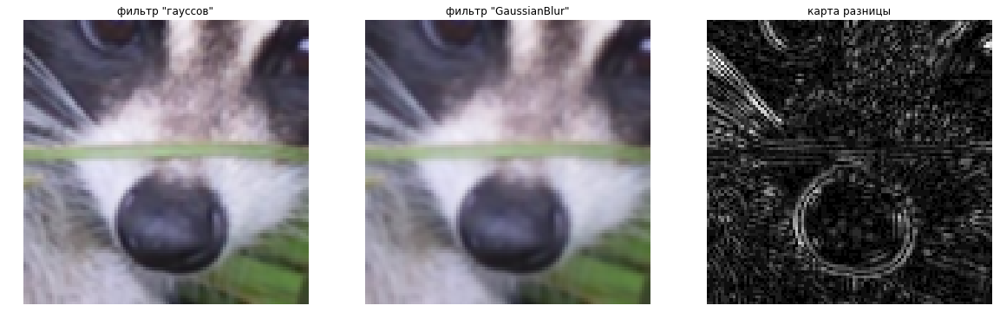

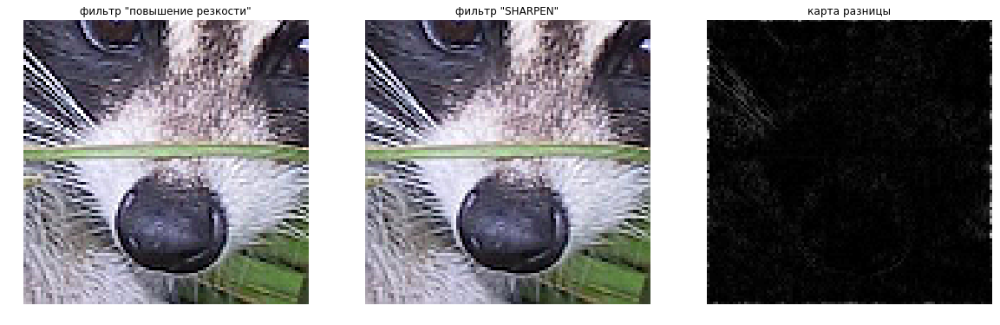

In [11]:
from PIL import ImageFilter
#важно: ImageFilter - не обрабатывает краевые пиксели, это заметно на картах разницы "сдвиг на 1" и "SHARPEN"
#обрежем изображение
test_img_arr = ImageRGBArr[150:250,250:350,:]
test_img = Image.fromarray(test_img_arr)

plt.figure(figsize=(5, 5))
plt.imshow(test_img_arr), plt.title('исходное изображение'),plt.axis('off')

plt.figure(figsize=(20, 10))
convolve_img_my = convolve(test_img_arr, KernelsList.get('усреднение'))
convolve_img = np.array(test_img.filter(ImageFilter.MedianFilter))
plt.subplot(131), plt.imshow(convolve_img_my), plt.title('фильтр "усреднение"'),plt.axis('off')
plt.subplot(132), plt.imshow(convolve_img), plt.title('фильтр "MedianFilter"'),plt.axis('off')
plt.subplot(133), plt.imshow(difference_map(convolve_img_my, convolve_img), cmap='gray'), plt.title('карта разницы'),plt.axis('off')
plt.show()

kernel = KernelsList.get('сдвиг на 1') #извлечем ядро
convolve_img_my = convolve(test_img_arr, kernel)
convolve_img = np.array(test_img.filter(ImageFilter.Kernel((3,3), kernel.ravel())))
plt.subplot(131), plt.imshow(convolve_img_my), plt.title('фильтр "сдвиг на 1"'),plt.axis('off')
plt.subplot(132), plt.imshow(convolve_img), plt.title('фильтр "Kernel"'),plt.axis('off')
plt.subplot(133), plt.imshow(difference_map(convolve_img_my, convolve_img), cmap='gray'), plt.title('карта разницы'),plt.axis('off')
plt.show()

convolve_img_my = convolve(test_img_arr, KernelsList.get('гауссов'))
convolve_img = np.array(test_img.filter(ImageFilter.GaussianBlur(1)))
plt.subplot(131), plt.imshow(convolve_img_my), plt.title('фильтр "гауссов"'),plt.axis('off')
plt.subplot(132), plt.imshow(convolve_img), plt.title('фильтр "GaussianBlur"'),plt.axis('off')
plt.subplot(133), plt.imshow(difference_map(convolve_img_my, convolve_img), cmap='gray'), plt.title('карта разницы'),plt.axis('off')
plt.show()

convolve_img_my = convolve(test_img_arr, KernelsList.get('повышение резкости'))
convolve_img = np.array(test_img.filter(ImageFilter.SHARPEN))
plt.subplot(131), plt.imshow(convolve_img_my), plt.title('фильтр "повышение резкости"'),plt.axis('off')
plt.subplot(132), plt.imshow(convolve_img), plt.title('фильтр "SHARPEN"'),plt.axis('off')
plt.subplot(133), plt.imshow(difference_map(convolve_img_my, convolve_img), cmap='gray'), plt.title('карта разницы'),plt.axis('off')
plt.show()




# 5.0

# Фильтр unsharp_mask взят из (source code) skimage

In [12]:
# Фильтр Unsharp Mask (Контурная резкость) усиливает контраст только на участках с резким перепадом яркости цвета.
# Изображение визуально кажется более резким за счет ореолов в переходных зонах.Фильтр позволяет достаточно 
# точно контролировать ореол.Толщина ореола должна быть такой, чтобы зритель ее не заметил.

# Эффект (Amount) — определяет, насколько сильно затемняются или осветляются участки изображения, находящиеся на границах 
# контура. Выражается в процентах. Так, значение 100 процентов означает, что разница в тоне на границе более светлого и 
# более тёмного участка усилится в два раза. На размер возникающего светлого или тёмного ореола данный параметр не влияет.

# Радиус (Radius) — влияет на степень размытия копии изображения. Этот параметр будет влиять на ширину зоны, в которой будет 
# проявляться изменение тона. Меньший радиус используется для подчёркивания мелких деталей, так как большее его значение 
# может приводить к их повреждению.

# Порог (Threshold) — определяет минимальную разницу тона, при которой осуществляется нерезкое маскирование. 
# При шумном или зернистом оригинале его выставляют на более высокое значение, чтобы предотвратить подчёркивание этих 
# нежелательных деталей.

from scipy.ndimage.filters import gaussian_filter

def _unsharp_mask_single_channel(image, radius, amount):
    #сначала к изображению применяется фильтр гаусса, желательно с минимальным радиусом
    blurred = gaussian_filter(image, sigma=radius, mode='reflect')
    #после чего к исходному изображению прибавляется разница между исходным и размытым. разница усиливается коэфф. amount
    result = image + (image - blurred) * amount
    return np.clip(result, 0., 1., out=result)


def unsharp_mask(image, radius=1.0, amount=1.0, multichannel=False):
    fimg = img_as_float(image) #переводим в диапозон от 0. до 1., так как будет использоваться фильтр гаусса

    if multichannel:
        result = np.empty_like(fimg, dtype=np.float) #создаем массив
        for channel in range(image.shape[-1]): #проходимся по каждому каналу
            result[..., channel] = _unsharp_mask_single_channel(fimg[..., channel], radius, amount)
        return result
    else:
        return _unsharp_mask_single_channel(fimg, radius, amount)

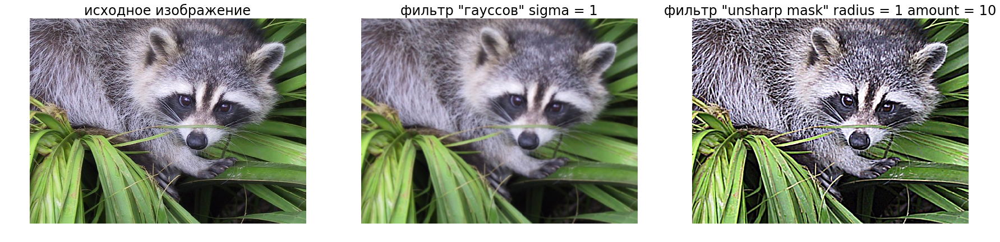

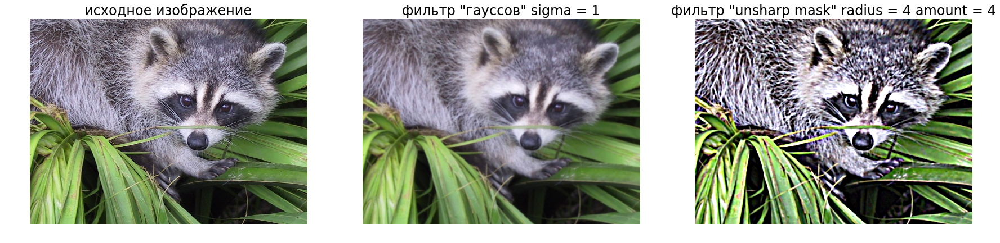

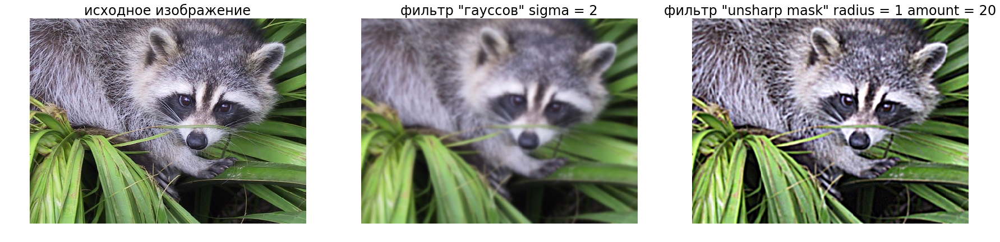

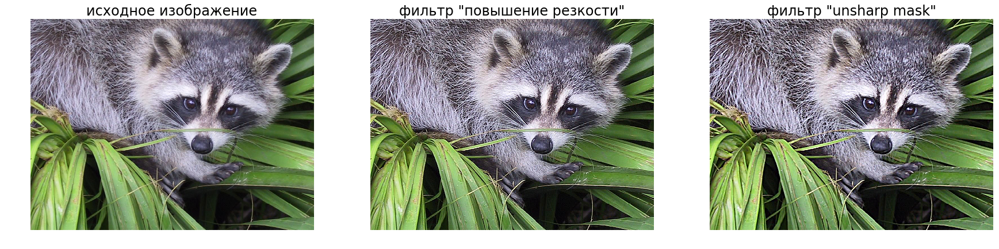

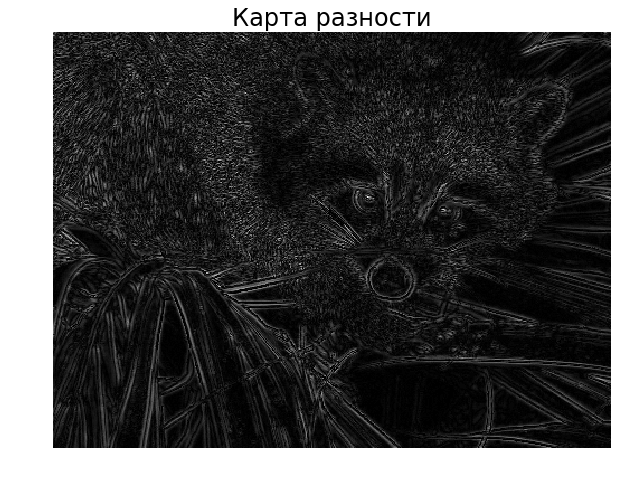

In [13]:
pylab.rcParams.update({'font.size': 20})
# функция повышения резкости с помощью гауссова фильтра. sigma - отклонение ядра фильтра, 
# влияет на уровень размытия фильтром "gaussian"
# radius и amount - влияет на повышения резкости фильтром unsharp_mask (см.выше)
def gaussian_sharpened(image, sigma = 1, radius = 1, amount=10):
    #Выводим исходное изображение----------------
    plt.figure(figsize=(30, 40))
    plt.subplot(131)
    plt.imshow(image),plt.title('исходное изображение'),plt.axis('off')
    #--------------------------------------------    
    #размываем фильтром "gaussian". 
    #фильтр возвращает массив float диапозоном значений от 0. до 1.
    img_blurred = img_as_ubyte(filters.gaussian(image, sigma, multichannel=True))

    
    #Выводим размытое изображение----------------
    plt.subplot(132)
    plt.imshow(img_blurred),plt.title('фильтр "гауссов" sigma = ' + str(sigma)),plt.axis('off')
    #--------------------------------------------
    
    #фильтр принимает массив только в диапозоне 0-1. поэтому переводим в диапазон 0-1.0 и результат обратно
    img_sharpened = img_as_ubyte(unsharp_mask(img_as_float(img_blurred), radius = radius, amount = amount, multichannel = True))
   
    #Выводим финально изображение----------------
    plt.subplot(133)
    plt.imshow(img_sharpened),plt.title('фильтр "unsharp mask" radius = ' + str(radius) + ' amount = ' + str(amount)),plt.axis('off')
    plt.show()
    #--------------------------------------------
    return img_sharpened

img_sharpened_1 = gaussian_sharpened(ImageRGBArr, sigma = 1, radius = 1, amount=10)
img_sharpened_2 = gaussian_sharpened(ImageRGBArr, sigma = 1, radius = 4, amount=4)
img_sharpened_3 = gaussian_sharpened(ImageRGBArr, sigma = 2, radius = 1, amount=20)

#применяем стандартный фильтр для повышения резкости
img_scharrp = convolve(ImageRGBArr, KernelsList.get('повышение резкости'),'replicate')

img_unsharp_mask = img_as_ubyte(unsharp_mask(ImageRGBArr, radius = 2, amount = 1, multichannel = True))

#Выводим изображения----------------
plt.figure(figsize=(30, 40))
plt.subplot(131)
plt.imshow(ImageRGBArr),plt.title('исходное изображение'),plt.axis('off')
plt.subplot(132)
plt.imshow(img_scharrp),plt.title('фильтр "повышение резкости"'),plt.axis('off')
plt.subplot(133)
plt.imshow(img_unsharp_mask),plt.title('фильтр "unsharp mask"'),plt.axis('off')
plt.show()
#--------------------------------------------
# карта разности между фильтром "повышение резкости" и "unsharp mask"
diff_map = difference_map(img_scharrp, img_unsharp_mask)
#Выводим изображения----------------
plt.figure(figsize=(10, 10))
plt.imshow(diff_map, cmap='gray'),plt.title('Карта разности'),plt.axis('off')
plt.show()
#--------------------------------------------